In [1]:
import cv2
import numpy as np
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display

from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.models import Model

In [2]:
from tensorflow.keras.layers import *

In [3]:
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPool2D, Conv2D, Lambda

from tensorflow.keras.layers import Dense, MaxPooling2D, AveragePooling2D, Concatenate, Add, BatchNormalization
from tensorflow.keras.layers import multiply, Reshape, Input, Activation,Flatten, GlobalMaxPooling2D

In [4]:
from tensorflow.keras import backend as K

In [5]:
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

In [6]:
PATH = ('Skin_data/')

In [7]:
BUFFER_SIZE = 400
BATCH_SIZE = 4
IMG_WIDTH = 256
IMG_HEIGHT = 256

def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    w = tf.shape(image)[1]
    w = w // 2
    input_image = image[:, :w, :]
    real_image = image[:, w:, :]
    real_image =tf.image.rgb_to_grayscale(real_image)
    
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)
    
    return input_image, real_image

In [8]:
inp, re = load(PATH+'train_color_fixed_data/ISIC_0000042.jpg')

In [9]:
def resize(input_image, real_image, height, width):
    
    input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    return input_image, real_image

In [10]:
def random_crop(input_image, real_image):
    
    cropped_input_image = tf.image.random_crop(
        input_image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
    
    cropped_real_image = tf.image.random_crop(
        real_image, size=[IMG_HEIGHT, IMG_WIDTH, 1])
    
    return cropped_input_image, cropped_real_image


In [11]:
def normalize(input_image, real_image):
    
    input_image = (input_image / 255.0)
    real_image = (real_image / 255.0)
    
    return input_image, real_image

In [12]:
@tf.function()
def random_jitter(input_image, real_image):
    
    input_image, real_image = resize(input_image, real_image, 286, 286)
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
        
    return input_image, real_image

In [13]:
def load_image_train(image_file):
    
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
    
    return input_image, real_image

In [14]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    
    input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
    
    input_image, real_image = normalize(input_image, real_image)
    
    return input_image, real_image

In [15]:
train_dataset = tf.data.Dataset.list_files(PATH+'train_color_fixed_data/*.jpg')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [16]:
test_dataset = tf.data.Dataset.list_files(PATH+'test_color_fixed_data/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [17]:
OUTPUT_CHANNELS = 1

In [18]:
def channel_attention(inputs,ratio=8):
    
    channel = inputs.shape[-1]       ### Channels on last axis
    
    ### Average
    avg_pool= GlobalAveragePooling2D()(inputs)  
    avg_pool= Reshape((1,1,channel))(avg_pool)
    dense_shared_1_avg= Dense(channel,activation='relu',kernel_initializer='he_normal')(avg_pool)
    bottleneck_avg= Dense(channel//ratio,activation='relu',kernel_initializer='he_normal')(dense_shared_1_avg)
    dense_shared_2_avg= Dense(channel,activation='relu',kernel_initializer='he_normal')(bottleneck_avg)

    ### Max
    max_pool= GlobalMaxPooling2D()(inputs)  
    max_pool= Reshape((1,1,channel))(max_pool)
    dense_shared_1_max= Dense(channel,activation='relu',kernel_initializer='he_normal')(max_pool)
    bottleneck_max= Dense(channel//ratio,activation='relu',kernel_initializer='he_normal')(dense_shared_1_max)
    dense_shared_2_max= Dense(channel,activation='relu',kernel_initializer='he_normal')(bottleneck_max)

      ### Add
    channel_comb=Add()([dense_shared_2_avg,dense_shared_2_max])
    channel_comb_sigmoid=Activation("sigmoid")(channel_comb)

      ### Multiplication
    channel_return=multiply([channel_comb_sigmoid,inputs])
    
    
    return channel_return

In [19]:
def spatial_attention(inputs):
    ### Channels on last considered
  
    ### Average pooling on channels
    avg_pool_channel=Lambda(lambda x: K.mean(x,axis=3,keepdims=True))(inputs)

  ### Max pooling on channels
    max_pool_channel=Lambda(lambda x: K.mean(x,axis=3,keepdims=True))(inputs)

  ### Concat 
    concat=Concatenate(axis=3)([avg_pool_channel,max_pool_channel])

  ### Dense
    kernel_size=7
    conv_concat=Conv2D(filters=1, kernel_size=kernel_size, strides=1,padding='same',activation='sigmoid',kernel_initializer='he_normal')(concat)

    spatial_return=multiply([conv_concat,inputs])
    
    return spatial_return

In [20]:
def cbam(inputs,ratio=8):
    bam= channel_attention(inputs, ratio)
    bam= spatial_attention(bam)
    
    return bam

In [21]:
def convolutional_bam(g,x):
    g_conv = cbam(g)
    x_conv = cbam(x)
    
    gc_sum = Add()([g_conv, x_conv])
    
    gc_conv = BatchNormalization()(gc_sum)
    gc_conv = Activation("relu")(gc_conv)
    gc_conv = Conv2D(filters, (3, 3), padding="same")(gc_conv)

    gc_mul = Multiply()([gc_conv, x])
    
    return gc_mul

In [22]:
def squeeze_excite_block(inputs, ratio=8):
    init = inputs
    channel_axis = -1
    filters = init.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)

    x = Multiply()([init, se])
    return x

In [23]:
def stem_block(x, n_filter, strides):
    x_init = x

    ## Conv 1
    x = Conv2D(n_filter, (3, 3), padding="same", strides=strides)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filter, (3, 3), padding="same")(x)

    ## Shortcut
    s  = Conv2D(n_filter, (1, 1), padding="same", strides=strides)(x_init)
    s = BatchNormalization()(s)

    ## Add
    x = Add()([x, s])
    x = squeeze_excite_block(x)
    return x

In [24]:
def aspp_block(x, num_filters, rate_scale=1):
    x1 = Conv2D(num_filters, (3, 3), dilation_rate=(6 * rate_scale, 6 * rate_scale), padding="same")(x)
    x1 = BatchNormalization()(x1)

    x2 = Conv2D(num_filters, (3, 3), dilation_rate=(12 * rate_scale, 12 * rate_scale), padding="same")(x)
    x2 = BatchNormalization()(x2)

    x3 = Conv2D(num_filters, (3, 3), dilation_rate=(18 * rate_scale, 18 * rate_scale), padding="same")(x)
    x3 = BatchNormalization()(x3)

    x4 = Conv2D(num_filters, (3, 3), padding="same")(x)
    x4 = BatchNormalization()(x4)

    y = Add()([x1, x2, x3, x4])
    y = Conv2D(num_filters, (1, 1), padding="same")(y)
    return y

In [25]:
def resnet_block(x, n_filter, strides=1):
    x_init = x

    ## Conv 1
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filter, (3, 3), padding="same", strides=strides)(x)
    ## Conv 2
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filter, (3, 3), padding="same", strides=1)(x)

    ## Shortcut
    s  = Conv2D(n_filter, (1, 1), padding="same", strides=strides)(x_init)
    s = BatchNormalization()(s)

    ## Add
    x = Add()([x, s])
    x = squeeze_excite_block(x)
    return x

In [26]:
def attetion_block(g, x):
    """
        g: Output of Parallel Encoder block
        x: Output of Previous Decoder block
    """

    filters = x.shape[-1]

    g_conv = BatchNormalization()(g)
    g_conv = Activation("relu")(g_conv)
    g_conv = Conv2D(filters, (3, 3), padding="same")(g_conv)

    g_pool = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(g_conv)

    x_conv = BatchNormalization()(x)
    x_conv = Activation("relu")(x_conv)
    x_conv = Conv2D(filters, (3, 3), padding="same")(x_conv)

    gc_sum = Add()([g_pool, x_conv])

    gc_conv = BatchNormalization()(gc_sum)
    gc_conv = Activation("relu")(gc_conv)
    gc_conv = Conv2D(filters, (3, 3), padding="same")(gc_conv)

    gc_mul = Multiply()([gc_conv, x])
    return gc_mul

In [27]:
def ResUnetPlusPlus():
    
    inputs = tf.keras.layers.Input(shape=[256,256,3])
    n_filters = [64, 128, 256, 512, 1024]

    c0 = inputs
    c1 = stem_block(c0, n_filters[0], strides=1)

        ## Encoder
    c2 = resnet_block(c1, n_filters[1], strides=2)
    c3 = resnet_block(c2, n_filters[2], strides=2)
    c4 = resnet_block(c3, n_filters[3], strides=2)

        ## Bridge
    b1 = aspp_block(c4, n_filters[4])

        ## Decoder
    x1 = cbam(c3)
    d1 = attetion_block(x1, b1)
    d1 = UpSampling2D((2, 2))(d1)
    d1 = Concatenate()([d1, c3])
    d1 = resnet_block(d1, n_filters[3])

    x2 = cbam(c2)
    d2 = attetion_block(x2, d1)
    d2 = UpSampling2D((2, 2))(d2)
    d2 = Concatenate()([d2, c2])
    d2 = resnet_block(d2, n_filters[2])

    x3 = cbam(c1)
    d3 = attetion_block(x3, d2)
    d3 = UpSampling2D((2, 2))(d3)
    d3 = Concatenate()([d3, c1])
    d3 = resnet_block(d3, n_filters[1])

        ## output
    outputs = aspp_block(d3, n_filters[0])
    outputs = Conv2D(1, (1, 1), padding="same")(outputs)
    outputs = Activation("sigmoid")(outputs)

        ## Model
    model = Model(inputs, outputs, name = "RESUNET_PLUS_PLUS")
    
    return model

In [28]:
generator = ResUnetPlusPlus()
generator.summary()

Model: "RESUNET_PLUS_PLUS"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 16) 0           batch_normalization[0][0]        
__________________________________________________________________________________

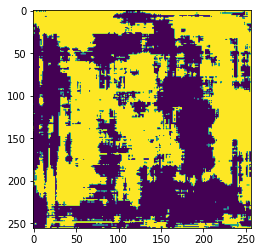

In [29]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

In [30]:
LAMBDA = 110

In [31]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

#     huber_loss = tf.reduce_mean(tf.keras.losses.huber(
#       target, gen_output, delta=1.0
#     ))
    
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    
    return total_gen_loss, gan_loss, l1_loss

In [32]:
def downsample(filters, size, apply_batchnorm=True):
    
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
        
    result.add(tf.keras.layers.LeakyReLU())
    
    return result

In [33]:
def Discriminator():
    
    initializer = tf.random_normal_initializer(0., 0.02)
    
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image')
    x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)
    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)
    
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
    
    return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [34]:
discriminator = Discriminator()
discriminator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 256, 256, 4)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128, 128, 64) 4096        concatenate_6[0][0]          

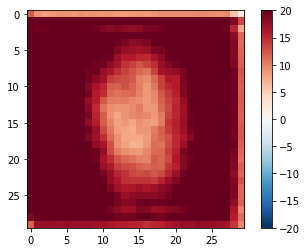

In [35]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [36]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    
    total_disc_loss = real_loss + generated_loss
    
    return total_disc_loss

In [37]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [38]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [39]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i])
        plt.axis('off')

    plt.show()

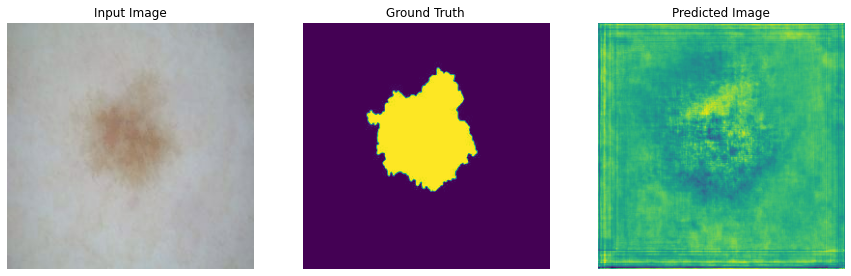

In [40]:
for example_input, example_target in test_dataset.take(1):
    z = generate_images(generator, example_input, example_target)
 

In [41]:
EPOCHS = 155

In [42]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [43]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    
    return gen_total_loss, disc_loss



In [44]:
global gen_lo
gen_lo = []

global disc_lo
disc_lo = []

global gen_graph
gen_graph = []

global disc_graph
disc_graph = []

In [45]:
def fit(train_ds, epochs, test_ds):
    
    for epoch in range(epochs):
        start = time.time()
        
        display.clear_output(wait=True)
        
        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        
        print("Epoch: ", epoch)
        
        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            
            if (n+1) % 20 == 0:
                print()
            
            ge, di = train_step(input_image, target, epoch)
            gen_lo.append(ge.numpy())
            disc_lo.append(di.numpy())
            
        x = sum(gen_lo)
        gen_graph.append(x/225.0)
        gen_lo.clear()
        
        y = sum(disc_lo)
        disc_graph.append(y/225.0)
        disc_lo.clear()
        
        print()
        
        if (epoch + 1) % 2 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
            
        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
               
    checkpoint.save(file_prefix = checkpoint_prefix)

In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

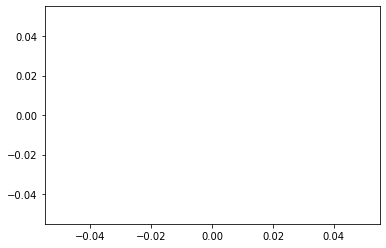

In [46]:
from matplotlib import pyplot as plt
plt.plot(gen_graph)

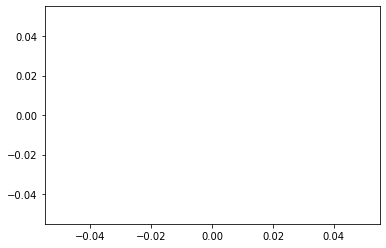

In [47]:
from matplotlib import pyplot as plt
plt.plot(disc_graph)

In [48]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [49]:
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score   


In [50]:
def generate_image(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    

    tar1 = tar[0].numpy()
    tar1[tar1<0.5] = 0
    tar1[tar1>0.5] = 1
    tar1 = np.abs(tar1)
    
    pred1 = prediction[0].numpy()
    pred1[pred1<0.5] = 0
    pred1[pred1>0.5] = 1
    pred1 = np.abs(pred1)
    y_true = tar1.flatten()
    y_pred = pred1.flatten()
 
    union = np.sum(y_true) + np.sum(y_pred)
    
    if union==0: return 1
    
    intersection = np.sum(y_true * y_pred)
    acc = 2. * intersection / union
        

    global seg_iou
    global seg_acc_value
    global seg_f1_value
    global seg_jac_value
    global seg_recall_value
    global seg_precision_value

    seg_iou = acc
    
    seg_acc_value = acc_value = accuracy_score(y_true, y_pred)
    seg_f1_value = f1_value = f1_score(y_true, y_pred, labels=[0, 1], average="binary")
    seg_jac_value = jac_value = jaccard_score(y_true, y_pred, labels=[0, 1], average="binary")
    seg_recall_value = recall_value = recall_score(y_true, y_pred, labels=[0, 1], average="binary")
    seg_precision_value = precision_value = precision_score(y_true, y_pred, labels=[0, 1], average="binary")
    
    seg_iou = acc    

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        if i == 0:
            plt.imshow(display_list[i])
        else:
            plt.imshow(display_list[i], cmap= 'gray')
#         plt.imshow(display_list[i])
        plt.axis('off')
    
    plt.show()

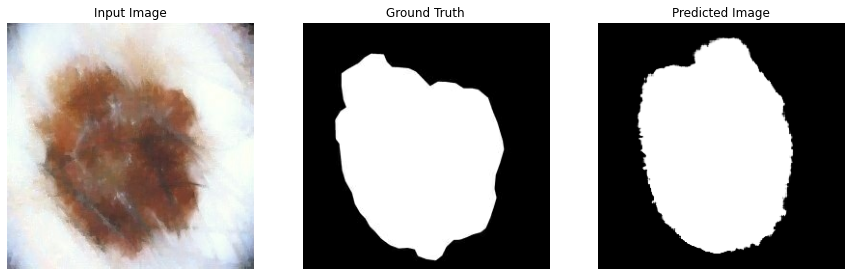

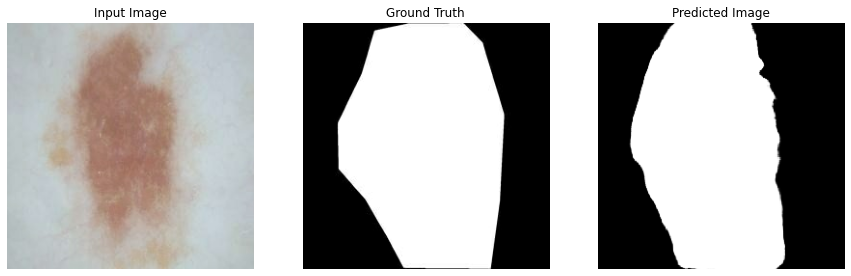

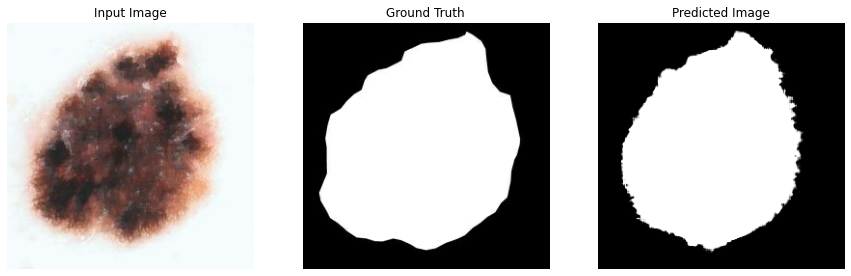

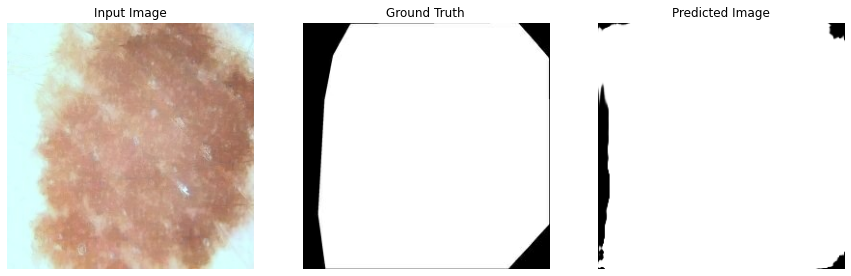

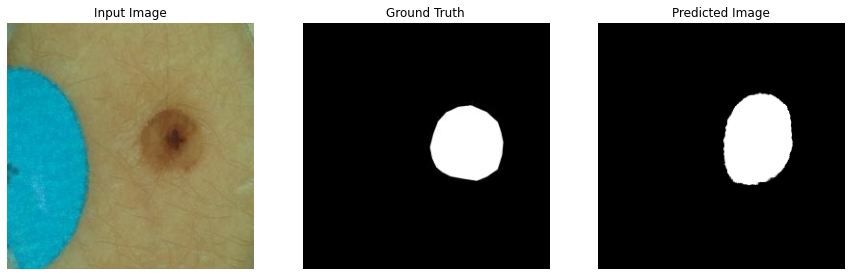

...

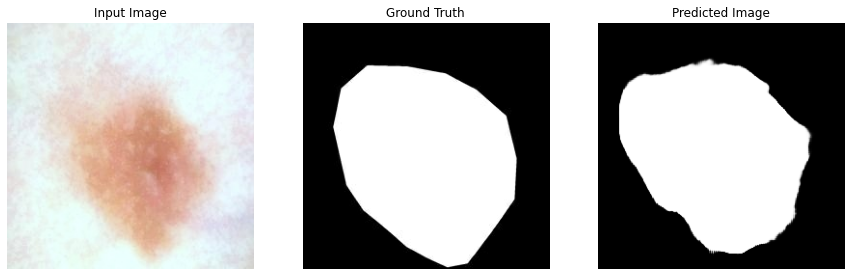

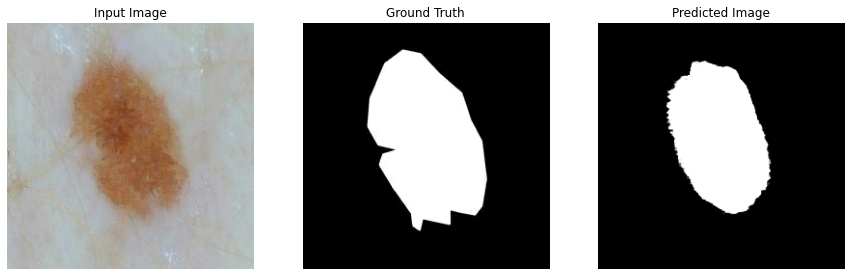

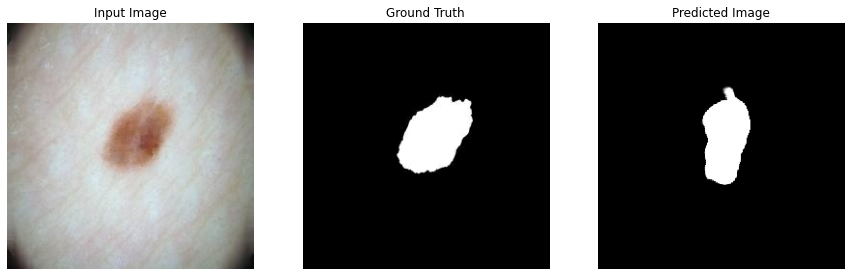

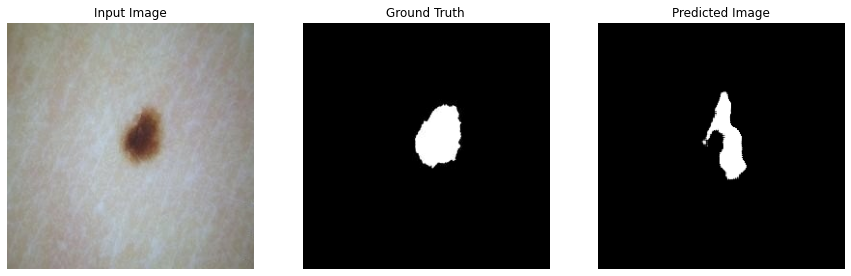

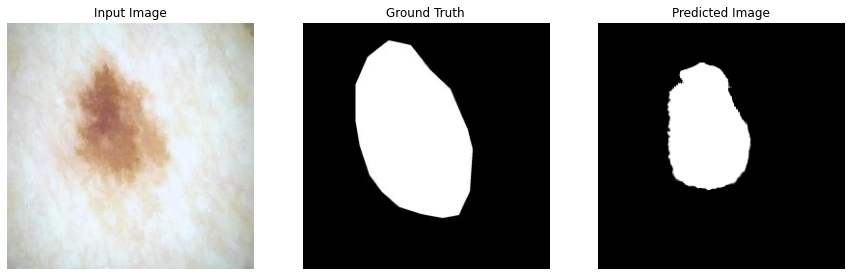

In [53]:
iou_mean = []
acc_mean = []
f1_mean = []
jac_mean = []
recall_mean = []
precision_mean = []

# Run the trained model on a few examples from the test dataset
for inp, tar in test_dataset.take(100):
    generate_image(generator, inp, tar)
    iou_mean.append(seg_iou)
    acc_mean.append(seg_acc_value)
    f1_mean.append(seg_f1_value)
    jac_mean.append(seg_jac_value)
    recall_mean.append(seg_recall_value)
    precision_mean.append(seg_precision_value)


In [54]:
from numpy import mean
print(mean(iou_mean))
print(mean(acc_mean))
print(mean(f1_mean))
print(mean(jac_mean))
print(mean(recall_mean))
print(mean(precision_mean))

0.7849305885979008
0.9194210654810855
0.7849305885979008
0.6739498003719161
0.8007537076668892
0.8299804131605365
